In [ ]:
!nvidia-smi

Wed May 22 11:36:05 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
!pip install ultralytics==8.0.196

from IPython import display
display.clear_output()
!yolo checks

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.9/78.2 GB disk)

OS                  Linux-6.1.85+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.67 GB
CPU                 Intel Xeon 2.00GHz
CUDA                12.1

matplotlib          ✅ 3.7.1>=3.3.0
numpy               ✅ 1.25.2>=1.22.2
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.3.0+cu121>=1.8.0
torchvision         ✅ 0.18.0+cu121>=0.9.0
tqdm                ✅ 4.66.4>=4.64.0
pandas              ✅ 2.0.3>=1.1.4
seaborn             ✅ 0.13.1>=0.11.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1


In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


# Load Libraries and Install YOLOv8

In [ ]:
from ultralytics import YOLO
from IPython.display import display, Image

# Load Custom Dataset from Roboflow

In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="API_KEY")
project = rf.workspace("staff-identification").project("staff-tag-detection-hu3tc")
version = project.version(1)
dataset = version.download("yolov8")

/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.9/74.9 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.3 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Staff-Tag-Detection-1 in yolov8:: 100%|██████████| 2603/2603 [00:00<00:00, 3697.96it/s]


# Train YOLOv8 Model on Custom Dataset

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=20 imgsz=640 plots=True

/content
100% 21.5M/21.5M [00:00<00:00, 106MB/s]
New https://pypi.org/project/ultralytics/8.2.19 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Staff-Tag-Detection-1/data.yaml, epochs=20, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, s

In [ ]:
!ls {HOME}/runs/detect/train/

args.yaml					    R_curve.png		val_batch0_labels.jpg
confusion_matrix_normalized.png			    results.csv		val_batch0_pred.jpg
confusion_matrix.png				    results.png		val_batch1_labels.jpg
events.out.tfevents.1716377896.0e18cb1efd6c.1250.0  train_batch0.jpg	val_batch1_pred.jpg
F1_curve.png					    train_batch1.jpg	val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch2.jpg	val_batch2_pred.jpg
labels.jpg					    train_batch710.jpg	weights
P_curve.png					    train_batch711.jpg
PR_curve.png					    train_batch712.jpg


/content


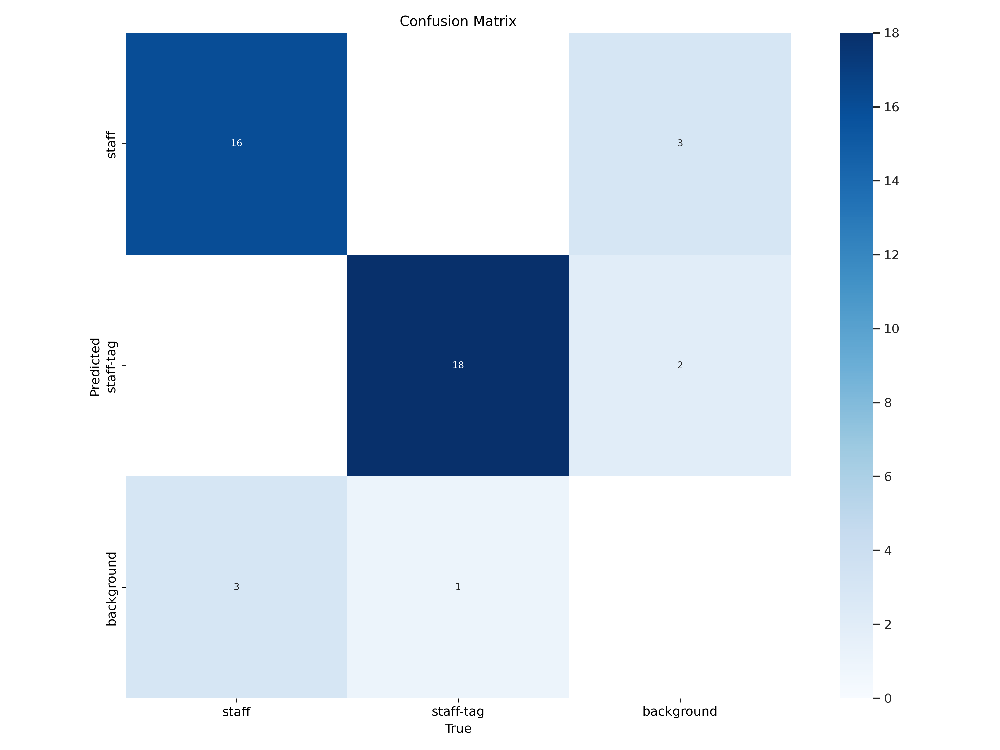

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

/content


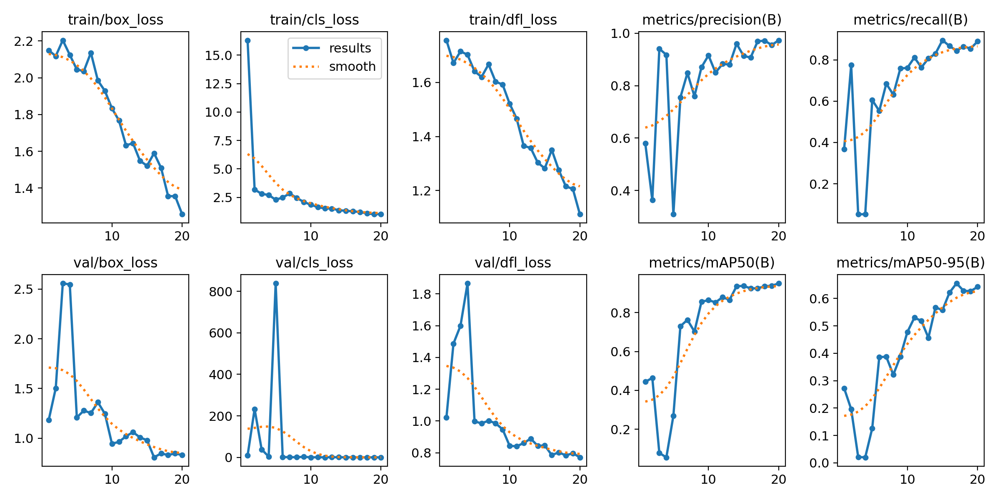

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

/content


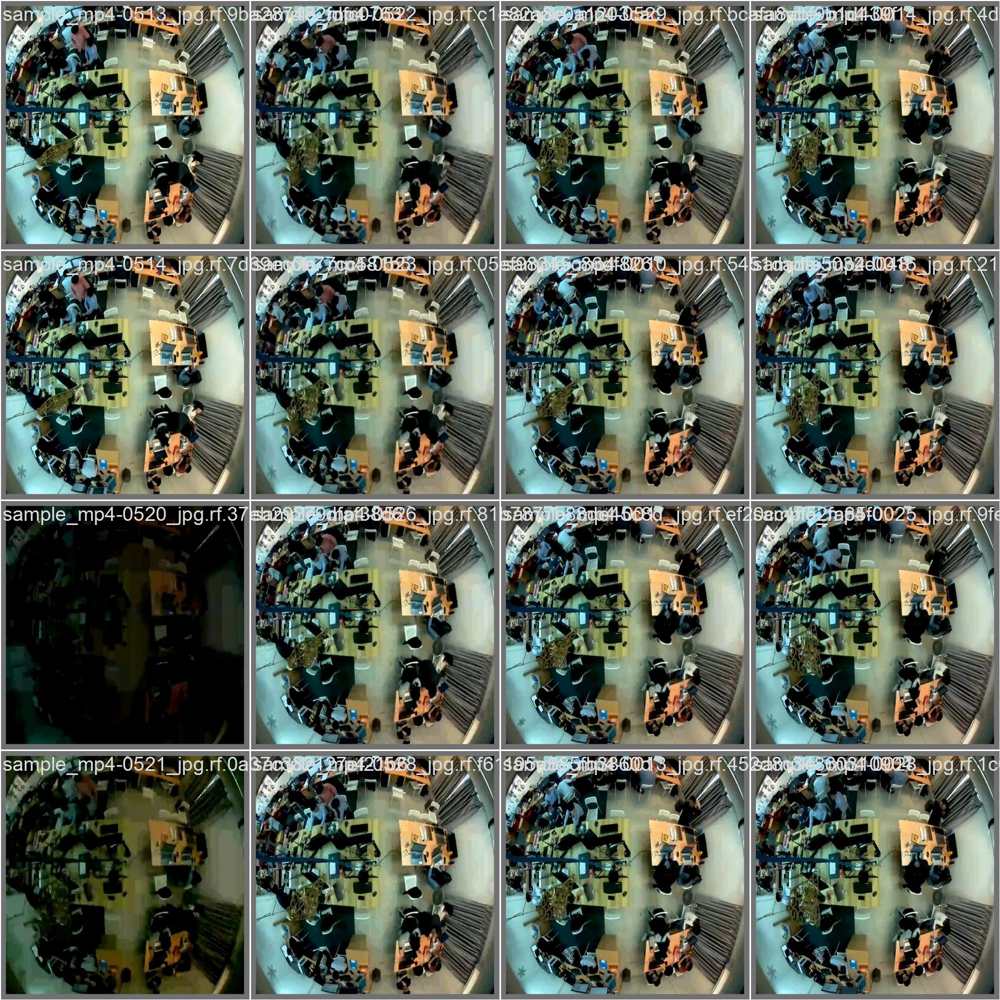

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

# Custom Model Validation

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/Staff-Tag-Detection-1/valid/labels.cache... 108 images, 89 backgrounds, 0 corrupt: 100% 108/108 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 7/7 [00:03<00:00,  1.94it/s]
                   all        108         38      0.969      0.845      0.925      0.643
                 staff        108         19      0.939       0.81      0.894      0.659
             staff-tag        108         19          1      0.879      0.956      0.628
Speed: 3.2ms preprocess, 12.7ms inference, 0.1ms loss, 6.2ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ultralytics.com/modes/val


# Inference with Custom Model

In [ ]:
%cd {HOME}

!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs

image 1/54 /content/datasets/Staff-Tag-Detection-1/test/images/sample_mp4-0004_jpg.rf.5993e074caada6f5a81c7d0d4633321d.jpg: 640x640 (no detections), 16.4ms
image 2/54 /content/datasets/Staff-Tag-Detection-1/test/images/sample_mp4-0015_jpg.rf.1eddb9cc3a166c614b7a20642538470d.jpg: 640x640 (no detections), 16.3ms
image 3/54 /content/datasets/Staff-Tag-Detection-1/test/images/sample_mp4-0018_jpg.rf.5a13570074a47ba0eab05015431ce209.jpg: 640x640 (no detections), 16.3ms
image 4/54 /content/datasets/Staff-Tag-Detection-1/test/images/sample_mp4-0020_jpg.rf.7f421a8b90e786e2830e3c5ff0ea3664.jpg: 640x640 (no detections), 16.3ms
image 5/54 /content/datasets/Staff-Tag-Detection-1/test/images/sample_mp4-0022_jpg.rf.1ea232b7739115f0d85513cd24f606e7.jpg: 640x640 (no detections), 16.3ms
image 6/54 /content/datasets/Staff-Tag-De

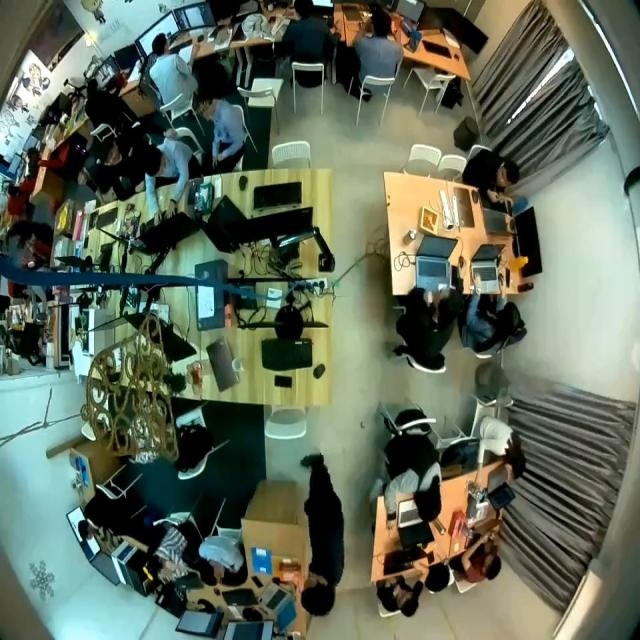

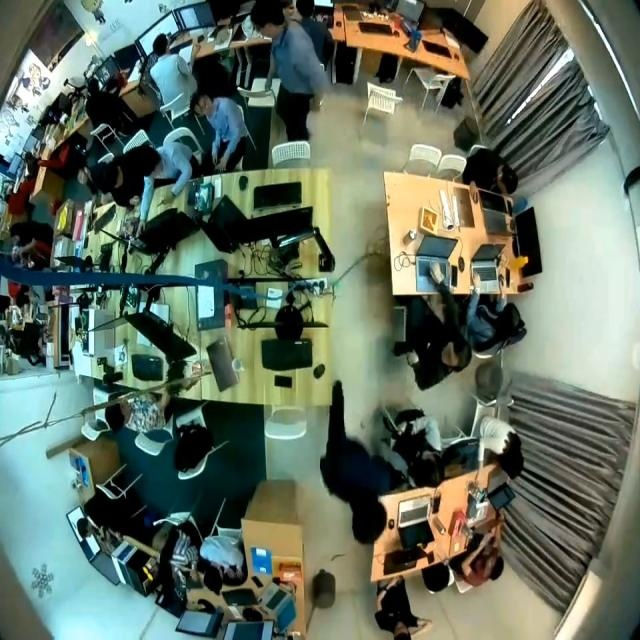

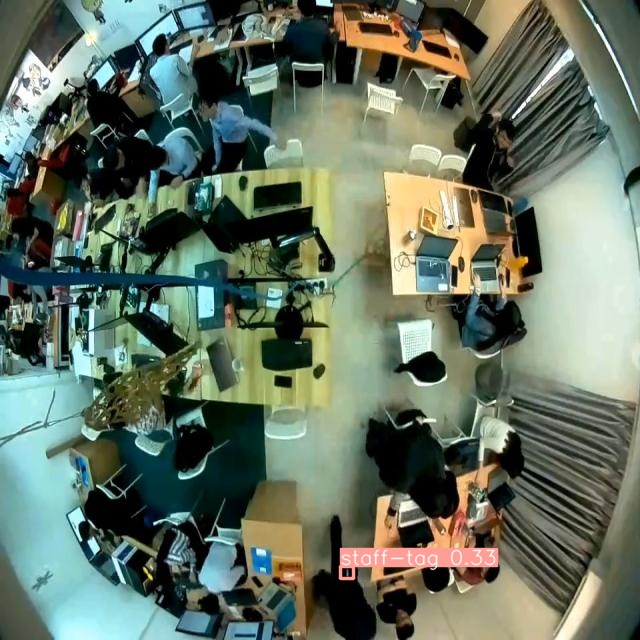

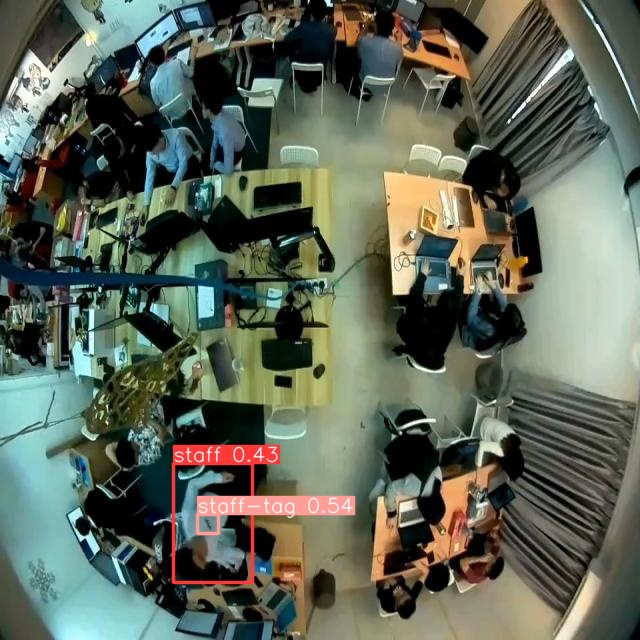

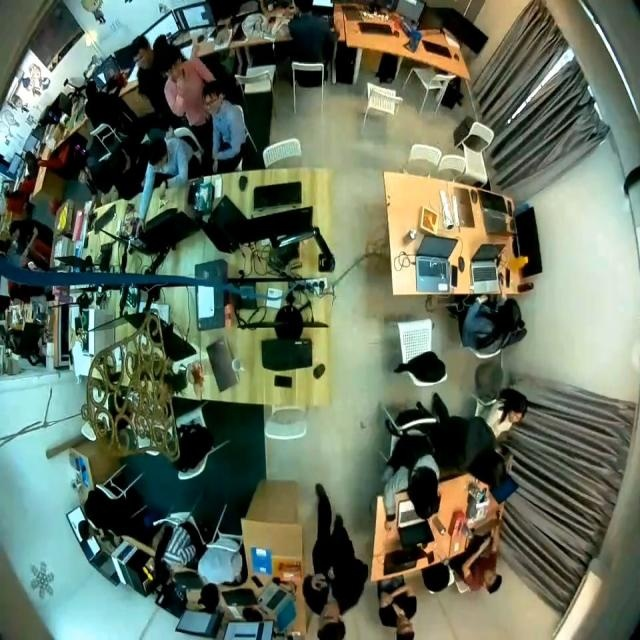

...

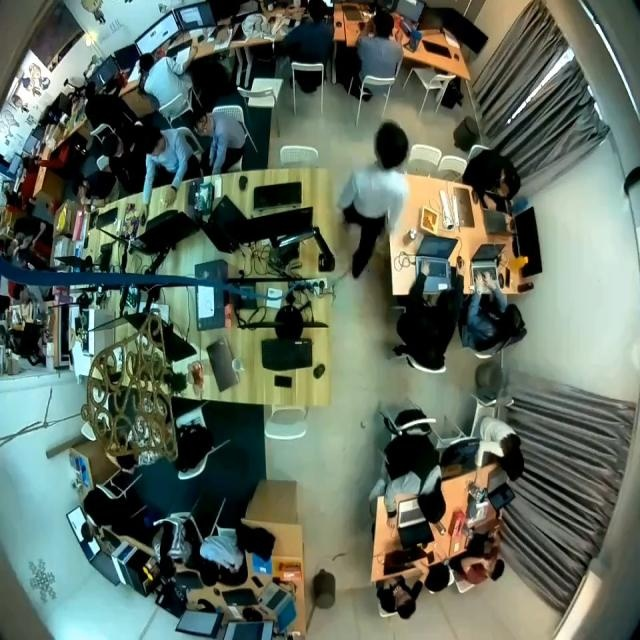

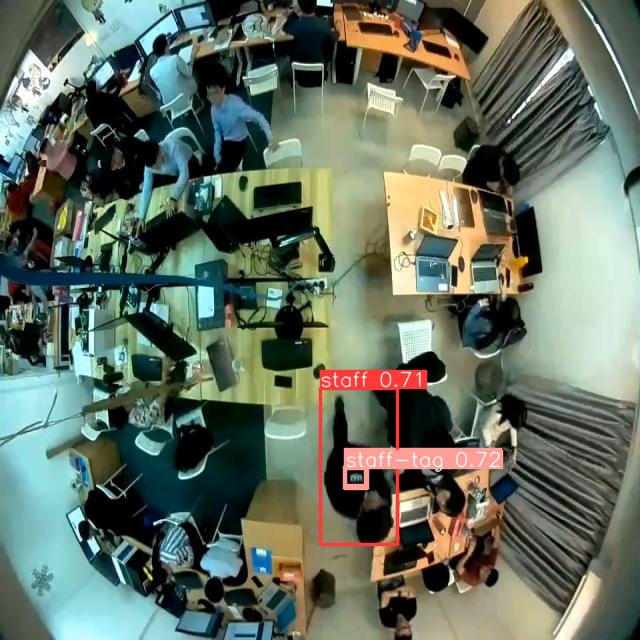

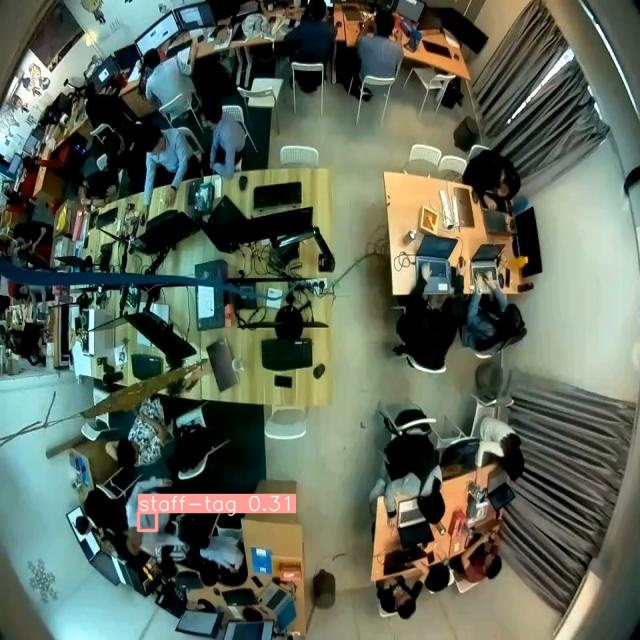

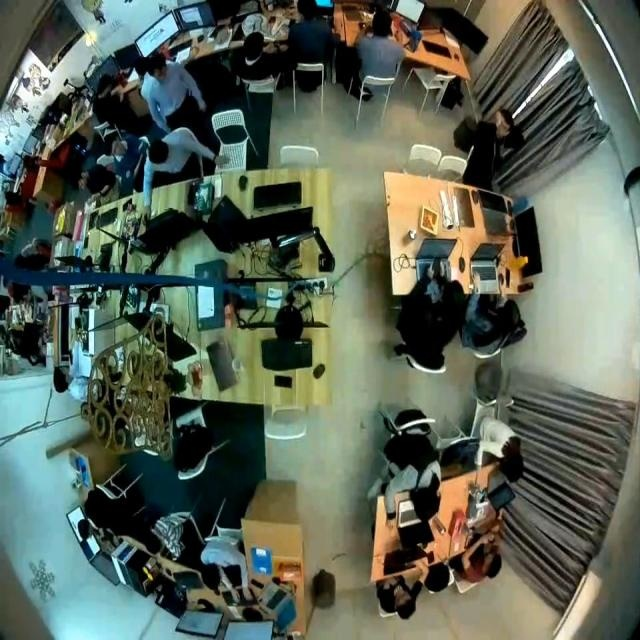

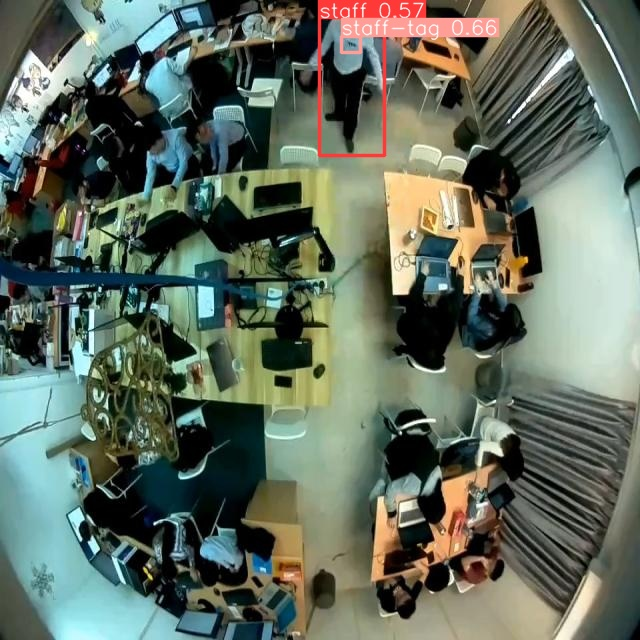

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source=/content/sample.mp4

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs

video 1/1 (1/1341) /content/sample.mp4: 480x640 (no detections), 120.2ms
video 1/1 (2/1341) /content/sample.mp4: 480x640 (no detections), 13.0ms
video 1/1 (3/1341) /content/sample.mp4: 480x640 (no detections), 13.0ms
video 1/1 (4/1341) /content/sample.mp4: 480x640 (no detections), 13.5ms
video 1/1 (5/1341) /content/sample.mp4: 480x640 (no detections), 13.0ms
video 1/1 (6/1341) /content/sample.mp4: 480x640 (no detections), 13.0ms
video 1/1 (7/1341) /content/sample.mp4: 480x640 (no detections), 13.0ms
video 1/1 (8/1341) /content/sample.mp4: 480x640 (no detections), 13.0ms
video 1/1 (9/1341) /content/sample.mp4: 480x640 (no detections), 12.9ms
video 1/1 (10/1341) /content/sample.mp4: 480x640 (no detections), 13.0ms
video 1/1 (11/1341) /content/sample.mp4: 480x640 (no detections), 12.9ms
video 1/1 (12/1341) /content/sample

# Deploy Custom Model on Roboflow

In [ ]:
project.version(dataset.version).deploy(model_type="yolov8", model_path=f"{HOME}/runs/detect/train/")

View the status of your deployment at: https://app.roboflow.com/staff-identification/staff-tag-detection-hu3tc/1
